# An information-theoretic quantification of the content of communication between brain regions

--------------------------
Lorenzo Cavezza - 2130648

Giulia Doda - 2104267

Giacomo Longaroni - 2126898

Laura Ravagnani - 2104271

---------------------------

#### Theoretical quantities

Transfer entropy $\mathbf{TE}$: the mutual information between $Y_{pres}$ and $X_{past}$, conditioned on $Y_{past}$

$$ TE(X\rightarrow Y) = I(X_{past}; Y_{pres}|Y_{past}) $$

where

$$ I(S=s,X_i) = \sum_{x_i \in X_i} p(x_i|s)\,\log\frac{p(s|x_i)}{p(s)}$$

is the specific information that the source $X_i$ carries about a specific outcome of the target variable $s\in S$.

Feature-specific Information Transfer $\mathbf{FIT}$:

$$ FIT = \text{min}[SUI(S: X_{past}, Y_{pres} \setminus Y_{past} ),\, SUI(Y_{pres}: X_{past}, S\setminus Y_{past})] $$

where 
- $SUI(S: X_{past}, Y_{pres} \setminus Y_{past} )$ is the information about $S$ that $X_{past}$ shares with $Y_{pres}$, it's unique with respect to $Y_{past}$ and it's defined as the difference between the shared information that $X_{past}, Y_{pres}$ carry about $S$ and the shared information that $X_{past}, Y_{pres}$ and $Y_{past}$ carry about $S$
- $SUI(Y_{pres}: X_{past}, S \setminus Y_{past})$ is the information about $Y_{pres}$ that $X_{past}$ shares with $S$ and it's unique with respect to $Y_{past}$

Moreover

$$ SUI(S:X_1,X_2) = \sum_{s\in S} p(s) \text{min}_{X_i \in \{ X_1, X_2\} } I(S=s,X_i) $$

is the shared information that $X_1$ and $X_2$ carry about $S$.


#### Description of neural activity for simulated data

Sender activity: 2D variable

$$X(t)_{stim} = S(t)(1+N(0, \sigma_{stim}))$$

where $S(t)$ is a step function equal to the value of the stimulus $s \in [1,4]$ during the time window $[200,250]\,ms$.

$$X(t)_{noise} = N(0,\sigma)$$

Receiver activity: 1D variable

$$Y(t) = W_{stim}X_{stim}(t-\delta) + W_{noise}X_{noise}(t-\delta) + N(0,\sigma)$$

where the delay $\delta$ is chosen randomly from a uniform distribution in $[40,60]\,ms$ in step of $10\,ms$, moreover $\sigma = 2$ and $\sigma_{stim} = \sigma/5 = 0.4$.


#### Numerical computation of $FIT$ and $TE$

Discretization of neural activity into a number $R=3$ of equipopulated bins and empirical computation of the occurence frequency of each binned response across all available trials.

$FIT$ and $TE$ are computed at the first time instant in which $Y$ received information from $X$.

Total of 50 simulation (subjects) with 2000 trials each ($\sim 500$ trials per stimulus value).

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle as pkl
from parameters import par
import plot_utils as pu

In [2]:
# import global parameters and simulation parameters

n_subjects = par.n_subjects
n_weights = len(par.w_noise) * len(par.w_sig)
n_binsS = par.n_binsS
n_bins = par.n_binsX
delay_max = par.delay_max
simLen = par.simLen
nShuff = par.nShuff
n_trials = par.nTrials_per_stim * par.n_binsS
n_test = par.n_test
w_sig = par.w_sig
w_noise = par.w_noise
snr = par.snr

## Validation

In [3]:
# files where the computations results are stored
# "3b" stands for "3 bins"
# "w" stands for "wrong" way of binning
# "r" stands for "right" way of binning

# figure 2A (heatmaps)
file_heatmap = 'heatmap_3b_w.npz'       
file_heatmap_r = 'heatmap_3b_r.npz'       
                                        
# figure 2B (temporal location)
file_tempor_loc = 'tempor_loc.npz'
file_tempor_loc_r = 'tempor_loc_r.npz'

# significance
file_sig_Sshuff = 'sig_w_Sshuff.npz'    
file_sig_Sfix = 'sig_w_Sfix.npz'
file_sig_Sshuff_r = 'sig_r_Sshuff.npz'
file_sig_Sfix_r = 'sig_r_Sfix.npz'

# figure 2E (fit directionality wrt snr)
file_time_series_2E = 'time_series_2E.npz'
file_fit_te_direct = 'fit_te_direct.npz'
file_fit_te_direct_r = 'fit_te_direct_r.npz'
                                     

### FIT and TE as a function of stimulus transmission strength

In this first part we study how the values of $FIT$ and $TE$ behave for all combinations of $W_{stim}$ and $W_{noise}$ in the range between 0 and 1, in steps of 0.1. The heatmaps show the average over all subjects simulations.

In [4]:
# load heatmap file
if os.path.exists(file_heatmap):

    loadnpz = np.load(file_heatmap)

    fit_heatmap = loadnpz['fit_heatmap']
    te_heatmap = loadnpz['te_heatmap']

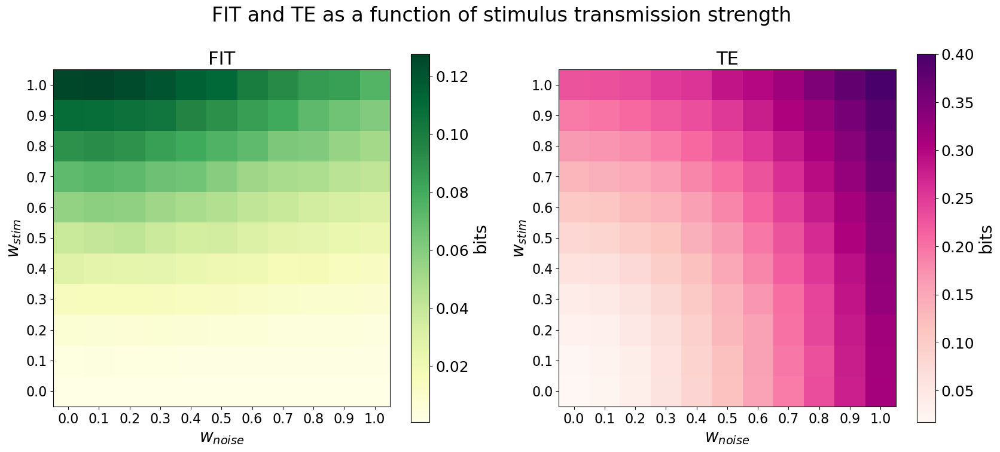

In [5]:
pu.plot_2A(fit_heatmap, te_heatmap, "FIT and TE as a function of stimulus transmission strength")

In [6]:
# load heatmap file with alternative binning
if os.path.exists(file_heatmap_r):

    loadnpz = np.load(file_heatmap_r)

    fit_heatmap_r = loadnpz['fit_heatmap']
    te_heatmap_r = loadnpz['te_heatmap']

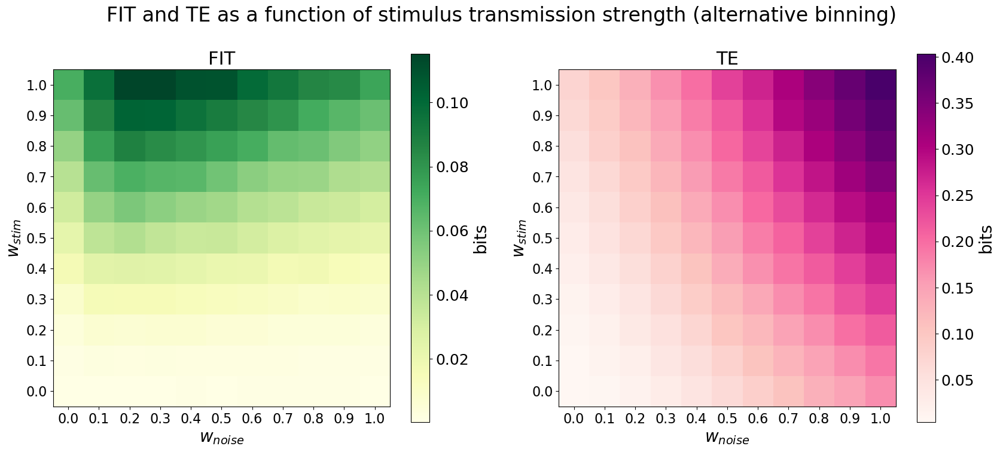

In [7]:
pu.plot_2A(fit_heatmap_r, te_heatmap_r, "FIT and TE as a function of stimulus transmission strength (alternative binning)")

### Temporal localization of stimulus-related transmission

We the investigated how well $FIT$ and $TE$ temporally localize the stimulus-feature-related information transmitted from $X$ to $Y$. In this second simulation we set $W_{stim}=0.5$ and $W_{noise}=1$ and computed $FIT$ and $TE$ at all time points, in a range of communication delays between 0 and 100 ms. The reults are averaged over subjects and delays.

In [8]:
# load temporal location file
if os.path.exists(file_tempor_loc):

    loadnpz = np.load(file_tempor_loc)

    fit_B = loadnpz['fit_B']
    fit_B_std = loadnpz['fit_B_std']
    te_B = loadnpz['te_B']
    te_B_std = loadnpz['te_B_std']

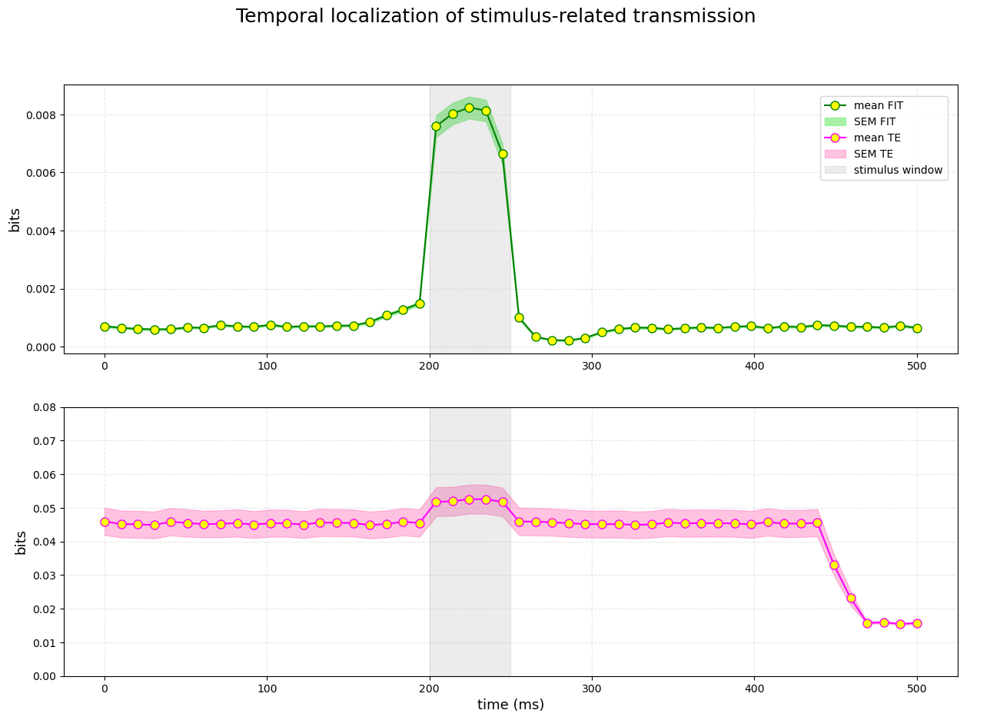

In [9]:
pu.plot_2B(fit_B, fit_B_std, te_B, te_B_std, "Temporal localization of stimulus-related transmission")

In [10]:
# load temporal location file with alternative binning
if os.path.exists(file_tempor_loc_r):

    loadnpz = np.load(file_tempor_loc_r)

    fit_B_r = loadnpz['fit_B']
    fit_B_std_r = loadnpz['fit_B_std']
    te_B_r = loadnpz['te_B']
    te_B_std_r = loadnpz['te_B_std']

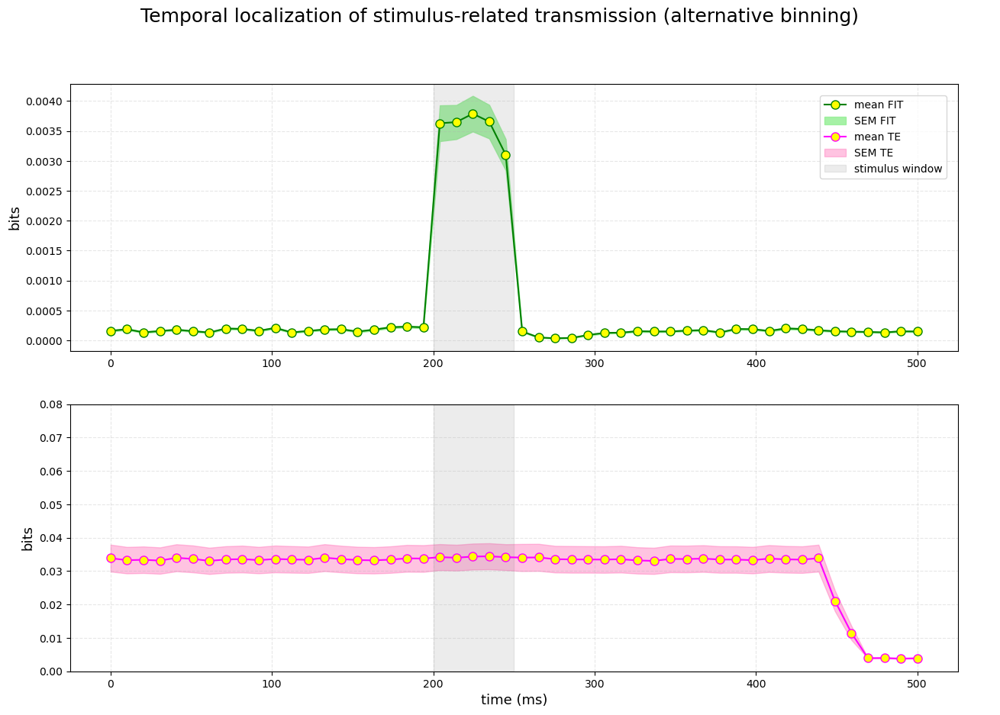

In [11]:
pu.plot_2B(fit_B_r, fit_B_std_r, te_B_r, te_B_std_r, "Temporal localization of stimulus-related transmission (alternative binning)")

### Significance test

To test for the significance of the information theoretic quantities we performed two permutation tests:
- permute $X$ across all trials at fixed stimulus to test for the presence of significant within-trial correlations between $X$ and $Y$;
- permute S across all trials to test for the presence of feature information in $X$ and $Y$.

For $TE$ we performed only the first permutation test, for $FIT$ we performed both.

We set the threshold for significance as the 95th percentile of the null distributios in a two-tails test.

In [12]:
# load significance file with shuffling on S
if os.path.exists(file_sig_Sshuff):

    loadnpz = np.load(file_sig_Sshuff)

    fit_sig_Sshuff = loadnpz['fit_sig_Sshuff']

# load significance file with shuffling on X at fixed S
if os.path.exists(file_sig_Sfix):

    loadnpz = np.load(file_sig_Sfix)

    fit_sig_Sfix = loadnpz['fit_sig_Sfix']
    te_sig_Sfix = loadnpz['te_sig_Sfix']

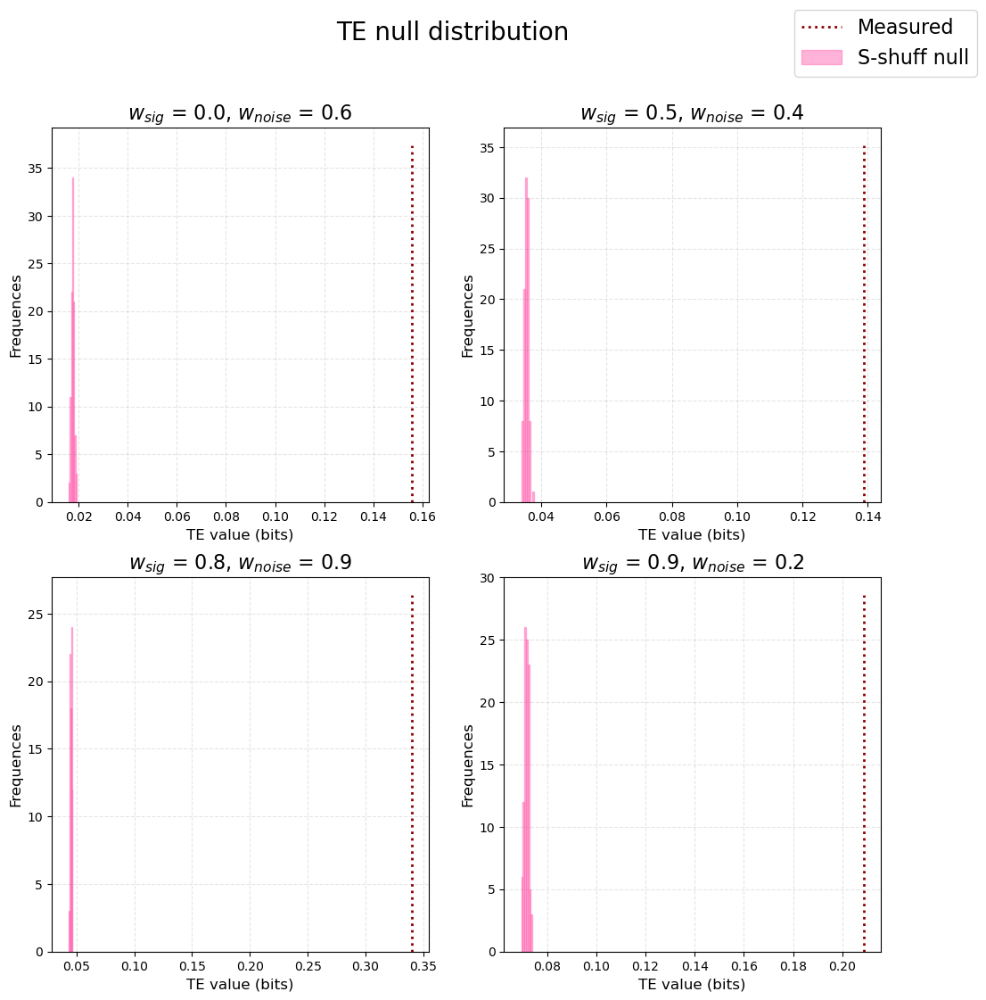

In [13]:
te_val = [te_heatmap[0, 6], te_heatmap[5, 4], te_heatmap[8, 9], te_heatmap[9, 2]] 
pu.plot_significance_te(te_sig_Sfix, te_val, 7, 'TE null distribution')

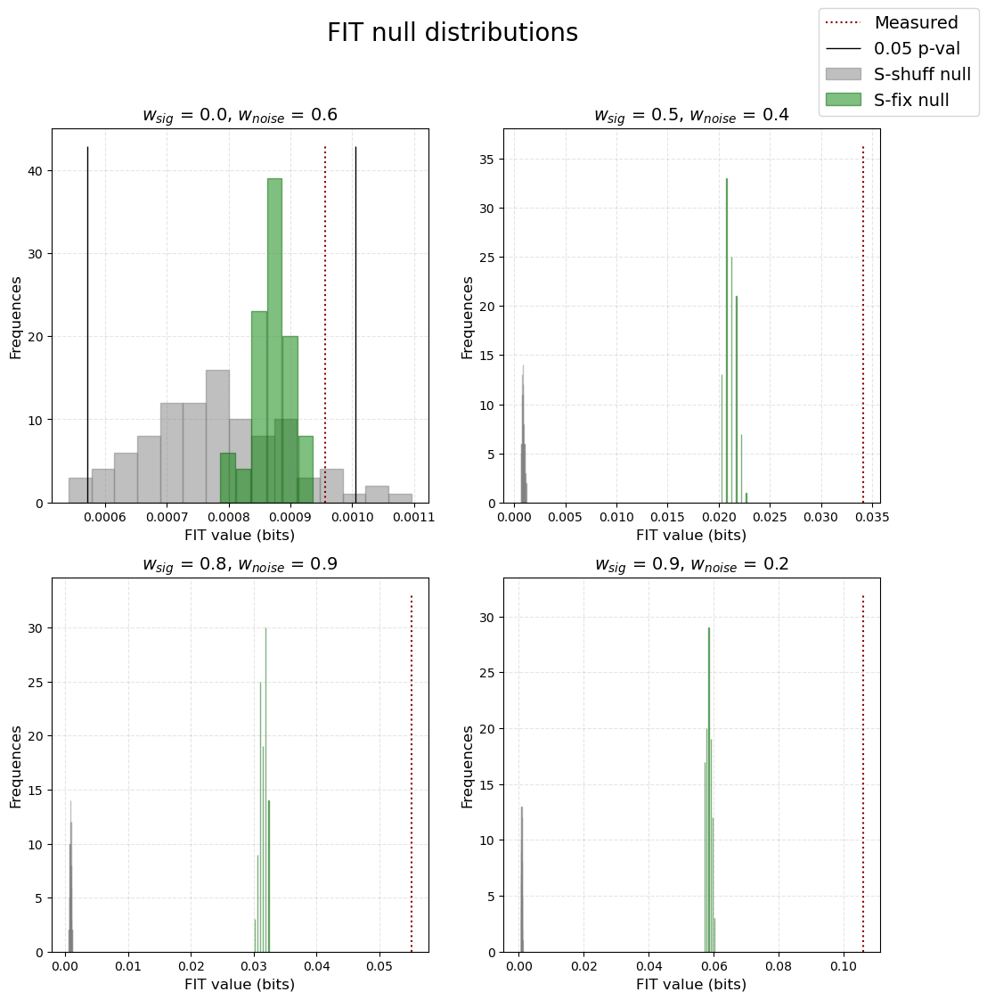

In [14]:
fit_val = [fit_heatmap[0, 6], fit_heatmap[5, 4], fit_heatmap[8, 9], fit_heatmap[9, 2]] 
pu.plot_significance_fit(fit_sig_Sshuff, fit_sig_Sfix, fit_val, bins_s=15, bins_f=6, factor=0.64, title='FIT null distributions')

In [15]:
# load significance file with shuffling on S with alternative binning
if os.path.exists(file_sig_Sshuff_r):

    loadnpz = np.load(file_sig_Sshuff_r)

    fit_sig_Sshuff_r = loadnpz['fit_sig_Sshuff_r']


# load significance file with shuffling on X at fixed S with alternative binning
if os.path.exists(file_sig_Sfix_r):

    loadnpz = np.load(file_sig_Sfix_r)

    fit_sig_Sfix_r = loadnpz['fit_sig_Sfix_r']
    te_sig_Sfix_r = loadnpz['te_sig_Sfix_r']

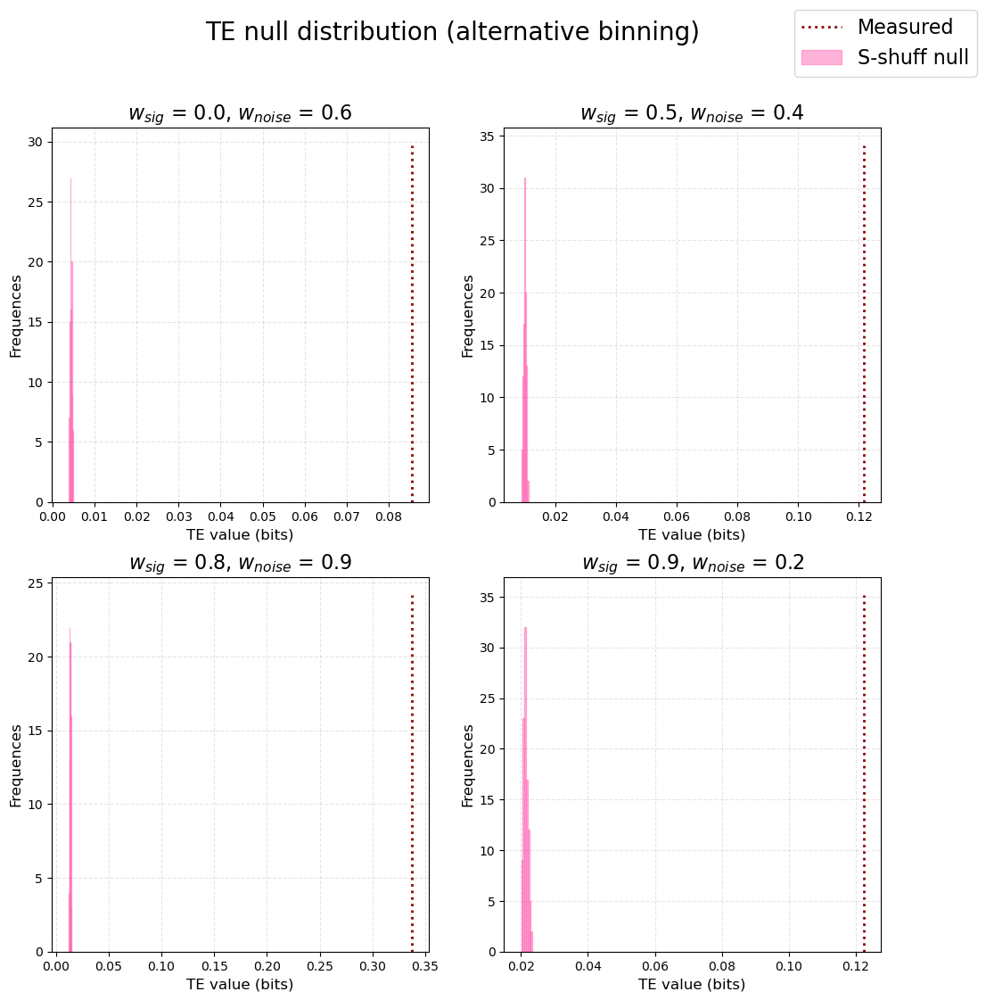

In [16]:
te_val_r = [te_heatmap_r[0, 6], te_heatmap_r[5, 4], te_heatmap_r[8, 9], te_heatmap_r[9, 2]] 
pu.plot_significance_te(te_sig_Sfix_r, te_val_r, 7, 'TE null distribution (alternative binning)')

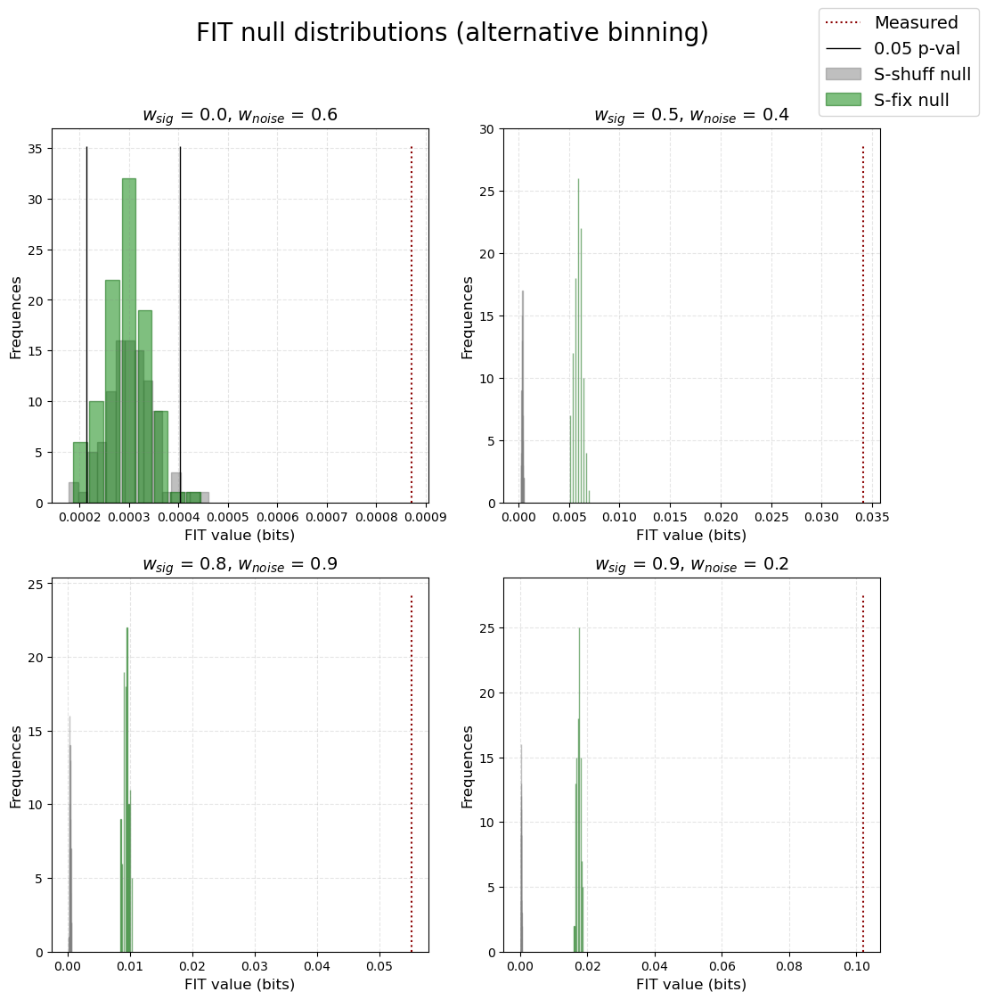

In [17]:
fit_val_r = [fit_heatmap_r[0, 6], fit_heatmap_r[5, 4], fit_heatmap_r[8, 9], fit_heatmap_r[9, 2]] 
pu.plot_significance_fit(fit_sig_Sshuff_r, fit_sig_Sfix_r, fit_val_r, bins_s=15, bins_f=8, factor=1.5, title='FIT null distributions (alternative binning)')

### FIT and TE trends with respect to SNR

In this last computation we investigate the behaviour of $FIT$ and $TE$ with respect to signal to noise ratio, defined as
$$ SNR = \frac{\delta}{\sigma} $$
where $\delta = 1$ for all simulation and $SNR$ values range between 0.05 and 1 with a precision of 0.05.
The computation is done for $W_{stim}=0.5$ and $W_{noise}=1$ and the results are averaged over the subjects.

In [18]:
# load trends file 
if os.path.exists(file_fit_te_direct):

    loadnpz = np.load(file_fit_te_direct)

    fit_E = loadnpz['fit_E_mean']
    fit_E_std = loadnpz['fit_E_std']
    te_E = loadnpz['te_E_mean']
    te_E_std = loadnpz['te_E_std']

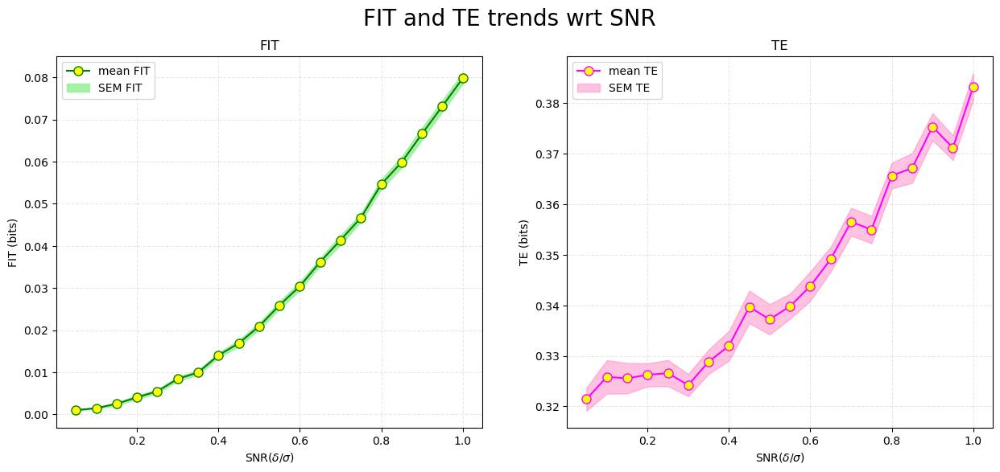

In [19]:
pu.plot_fig2E(fit_E, fit_E_std, te_E, te_E_std, snr, 'FIT and TE trends wrt SNR')

In [20]:
# load trends file with alternative binning
if os.path.exists(file_fit_te_direct_r):

    loadnpz = np.load(file_fit_te_direct_r)

    fit_E_r = loadnpz['fit_E_mean_r']
    fit_E_std_r = loadnpz['fit_E_std_r']
    te_E_r = loadnpz['te_E_mean_r']
    te_E_std_r = loadnpz['te_E_std_r']

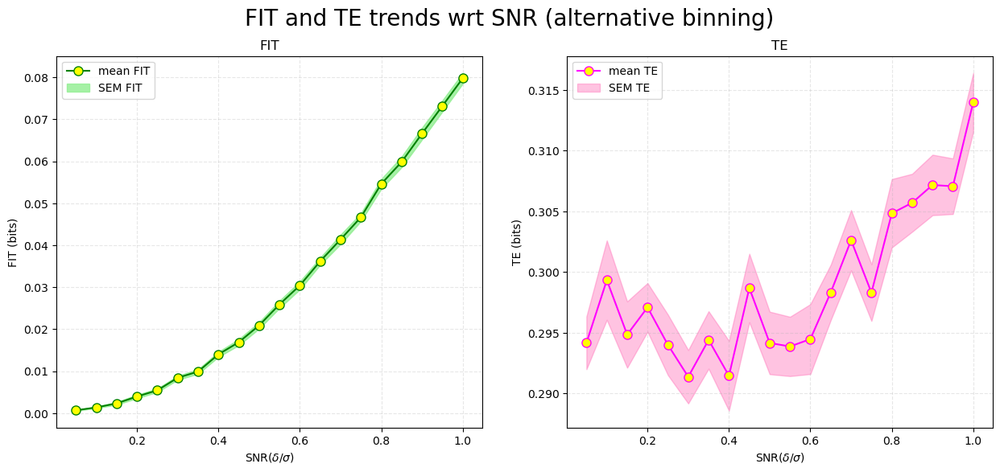

In [21]:
pu.plot_fig2E(fit_E_r, fit_E_std_r, te_E_r, te_E_std_r, snr, 'FIT and TE trends wrt SNR (alternative binning)')

## EEG data analysis results

Next to test the performance of the FIT function we built we use it on a published dataset of EEG data measured on human participants involved in a lab test. The aim of the experiment was to measure the brain activity in certain regions through an EEG device when the participants were asked to detect the presence of either a face or a random texture in an image covered by a randomly generated mask. <br>
Previous tests showed that the detection depended on how much of the eye region of the faces shown was revealed. They then showed the appearance of a signal in a specific brain region called Occipito-Temporal on either sides of the brain. In particular the signal appeared roughly 120 ms after the image in the OT region on the opposite side to the position of the eye in the image and 20-40 ms later in the other side.<br> 
We aim at measuring if eye-specific information has travelled between the two brain regions through the FIT measure.

In [22]:
# util function to read file
def read_file(filename):
    with open(filename, 'rb') as file:
        loaded_file = pkl.load(file)
    return loaded_file

In [23]:
# files
left_LR_file = 'eeg_left_LR_values.pkl'
left_RL_file = 'eeg_left_RL_values.pkl'

right_LR_file = 'eeg_right_LR_values.pkl'
right_RL_file = 'eeg_right_RL_values.pkl'

# load values
left_LR = np.array(read_file(left_LR_file))
left_RL = np.array(read_file(left_RL_file))

right_LR = np.array(read_file(right_LR_file))
right_RL = np.array(read_file(right_RL_file))

### Left Eye Visibility

We begin by looking for eye-specific directed information between OTs on opposite brain sides for left eye visibility. Here we expect to see a greater signal from the Right to the Left side since this is what was measured by previous tests.<br>
We begin by comparing Left to Right and Right to Left Directions for TE.

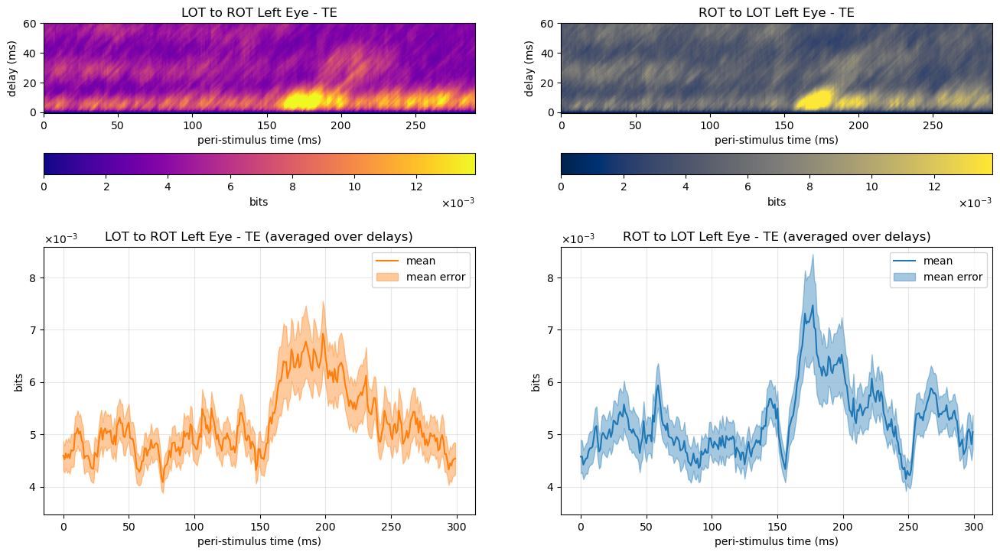

In [24]:
pu.plot_map4(left_LR[0, :, :], left_RL[0, :, :], 'Left Eye - TE', 0.85,1.15,'Paper',290,0.6)

As we can see there is not much difference in the signals both in shape and strength. We see that in both there is a signal of strength 6-7 mBits at about 160 ms after the image in both directions, which appears to be a bit strange since it woulnd't imply any information transmission between the regions but an immediate surge in information observed in both. <br>
Also we can see from the heatmaps that the surge in informations happened for very small delays, too short for any information to be transferred confirming what we initially thought, that TE can't detect eye-specific information transmission between ROT and LOT.

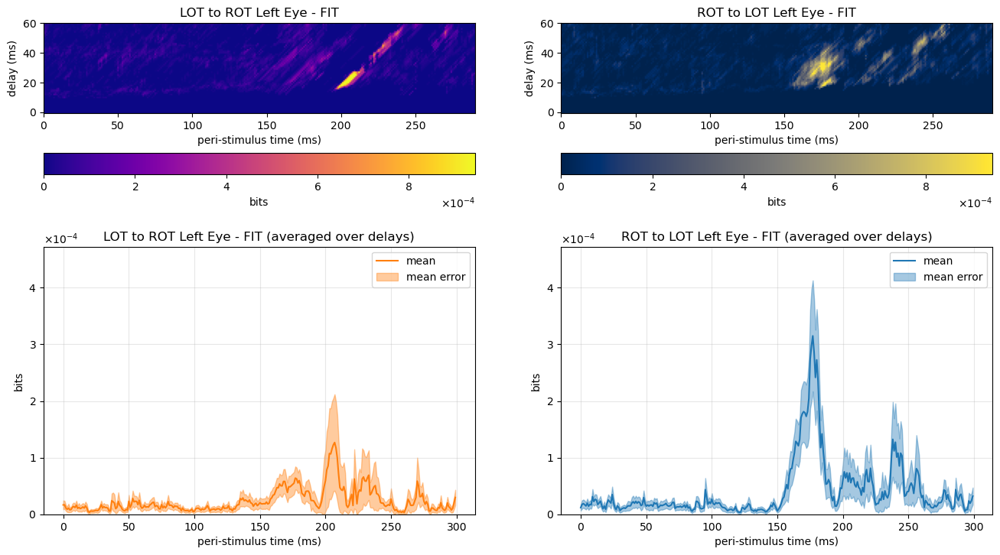

In [25]:
pu.plot_map4(left_LR[1, :, :], left_RL[1, :, :], 'Left Eye - FIT',0.0,1.5,'Paper',290,0.6)

Moving onto what FIT detected we can see two information surges earlier from 160 ms at a strength of up to 0.3 mBits for ROT to LOT, and a smaller but more concentrated signal at 0.1 mBits in the opposite direction about 40 ms later. From the heatmaps both signals where measured considering a delay of 20 to 40 ms. <br>
This confirms that there was an eye-specific signal transmitted from the ROT to the LOT as expected, and also a much weaker signal in the opposite direction later on. This difference both in strenght and time highlights how FIT can distinguish with greater precision the correct feature specific information flow correctly assessing that after 160 ms after the image there was a clear ROT to LOT signal and no opposite direction one. 

### Right Eye Visibility

We do the same for the right eye.

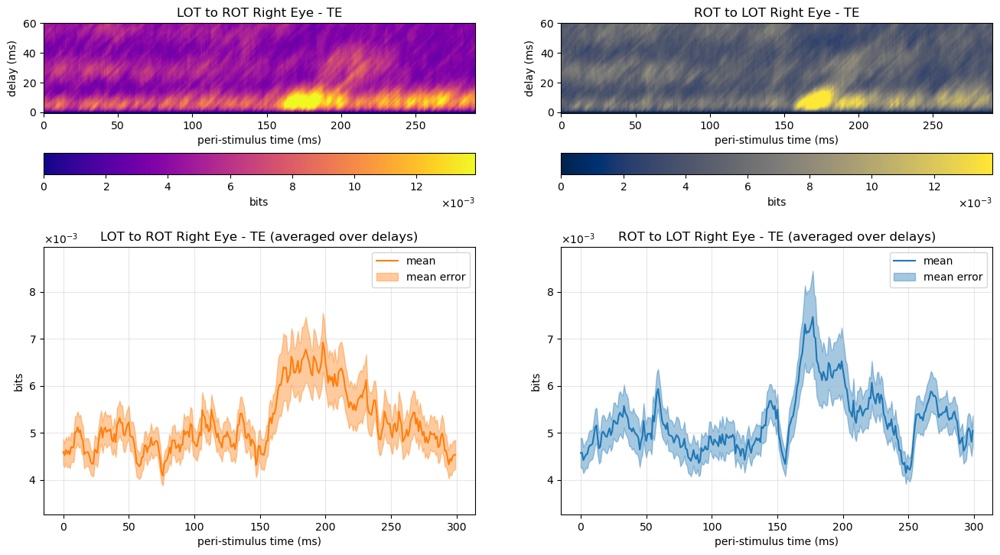

In [26]:
pu.plot_map4(right_LR[0, :, :], right_RL[0, :, :], 'Right Eye - TE',0.8,1.2,'Paper',290,0.6)

We see a similar pattern to what we saw for the right eye, so no ability to distinguish the feature specific information flow between the correct regions.

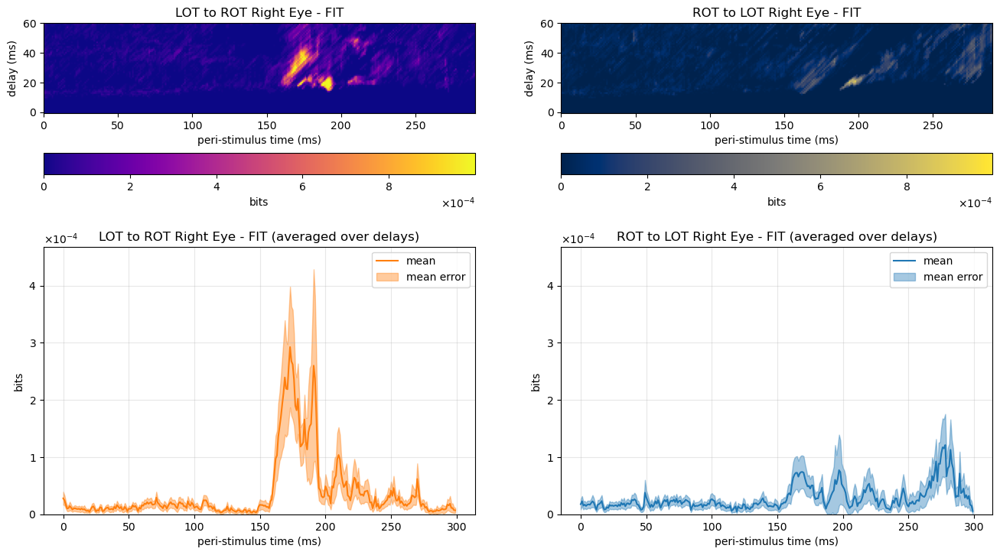

In [27]:
pu.plot_map4(right_LR[1, :, :], right_RL[1, :, :], 'Right Eye - FIT',0.0,1.6,'Paper',290,0.6)

For FIT  we see a clear signal in the LOT to ROT direction as expected.

###  Bias Corrections

It is often observed that information measures like FIT or TE are systematically biased when having a small number of samples, particularly they tend to overestimate the information they measure.
To determine its nature for our dataset we compute both linear and quadratic approximations of the FIT and TE measures varying the dataset size.<br><br>
For a linear bias $FIT_{true}=\lim_{ n \to \infty }FIT(n)=\lim_{ n \to \infty }\left(a_l\frac{1}{n}+b_l\right)=b_l$ with $a_l$ and $b_l$ fit variables we obtain by fitting the FIT values measured for different dataset sizes with a linear function.<br><br>
For a quadratic bias $FIT_{true}=\lim_{ n \to \infty }FIT(n)=\lim_{ n \to \infty }\left(a_q\frac{1}{n^2}+b_q\frac{1}{n}+c_q\right)=c_q$ where $a_q$, $b_q$ and $c_q$ are fit variables.<br><br>
In practice we turn the original datasets into 3 different sized sets of datasets, 1 dataset equal to the original, 2 with half the size and 4 with a fourth of the size. We compute the FIT and TE on each of the subsets and get a mean value for each of the 3 sizes. We obtain a robust value for both measure by taking the average over 20 trials, where each trial involves shuffling the indexes in the dataset before dividing it.
We then fit a linear or quadratic model to it and take the intercept in both as the unbiased estimate.

Here we show all the results found:

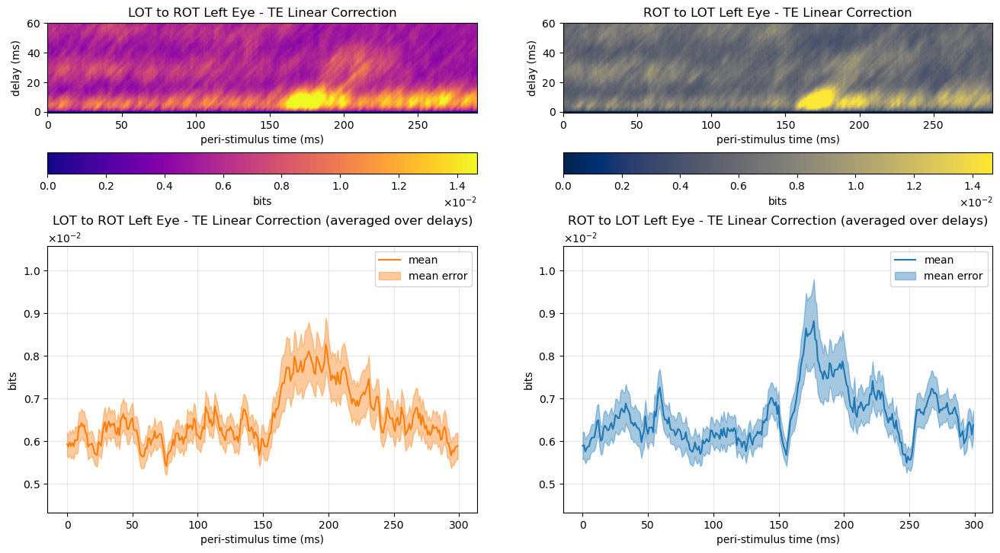

In [28]:
pu.plot_map4(left_LR[3, :, :], left_RL[3, :, :], 'Left Eye - TE Linear Correction',0.8,1.2,'Paper',290,0.6)

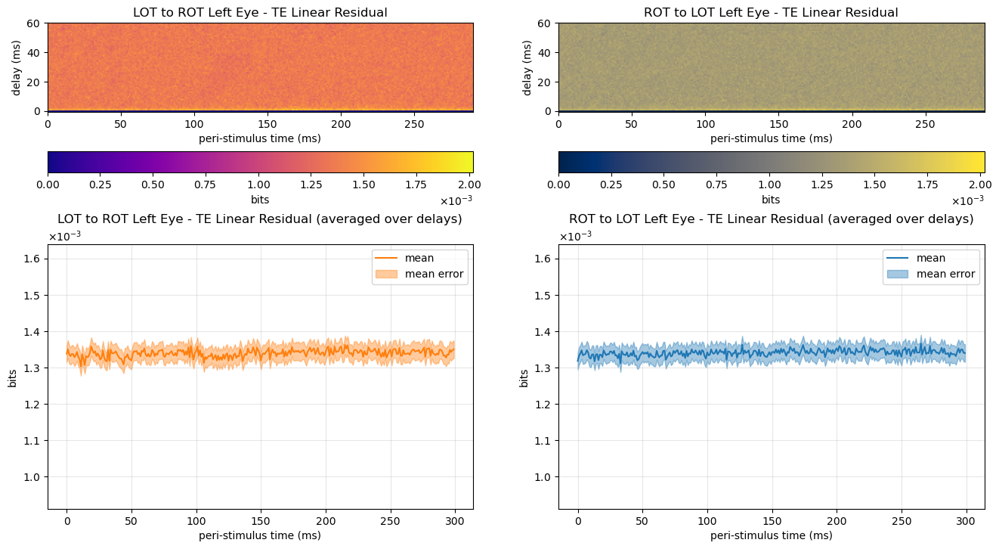

In [29]:
pu.plot_map4(left_LR[3, :, :, :]-left_LR[0, :, :, : ], left_RL[3, :, :, :]-left_RL[0, :, :, :], 'Left Eye - TE Linear Residual',0.7,1.2,'Paper',290,1)

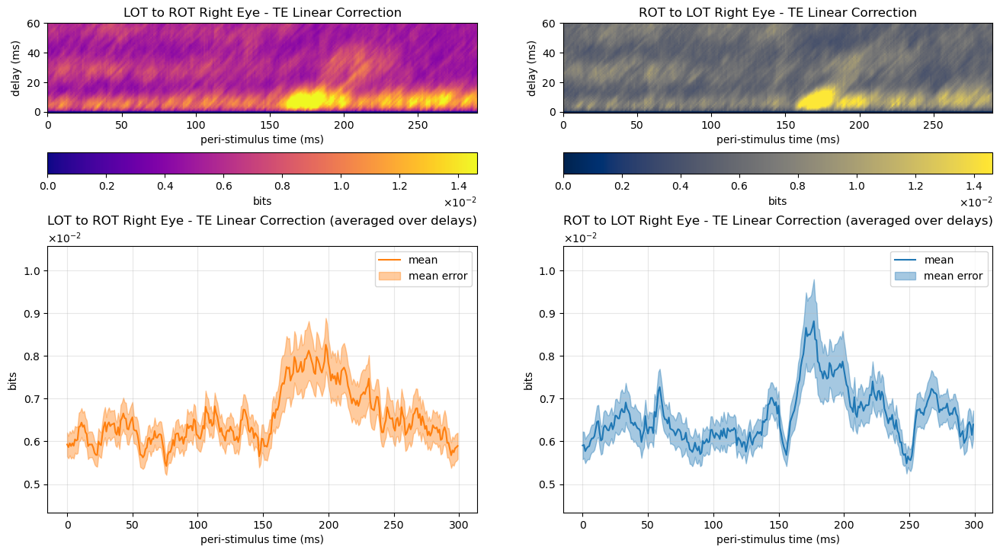

In [30]:
pu.plot_map4(right_LR[3, :, :], right_RL[3, :, :], 'Right Eye - TE Linear Correction',0.8,1.2,'Paper',290,0.6)

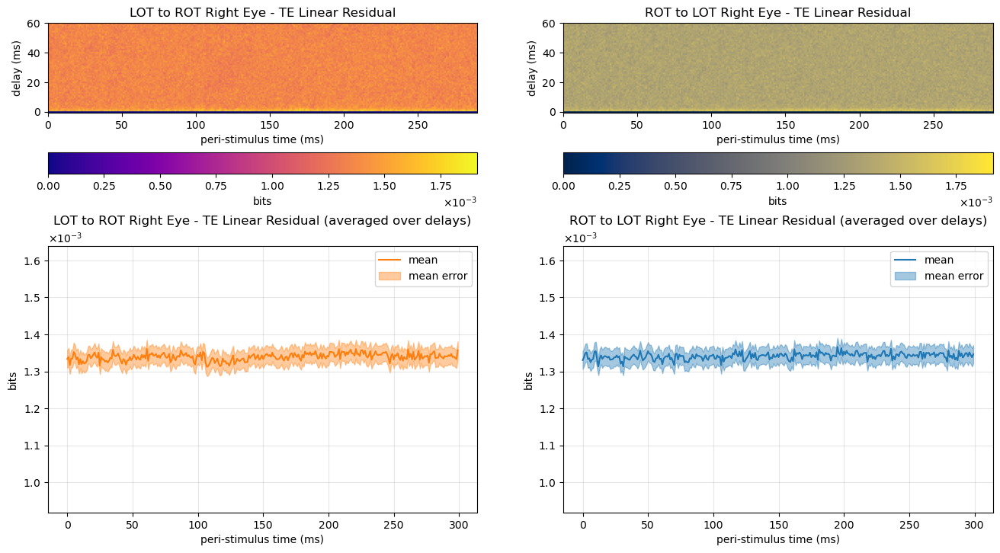

In [31]:
pu.plot_map4(right_LR[3, :, :, :]-right_LR[0, :, :, : ], right_RL[3, :, :, :]-right_RL[0, :, :, :], 'Right Eye - TE Linear Residual',0.7,1.2,'Paper',290,1)

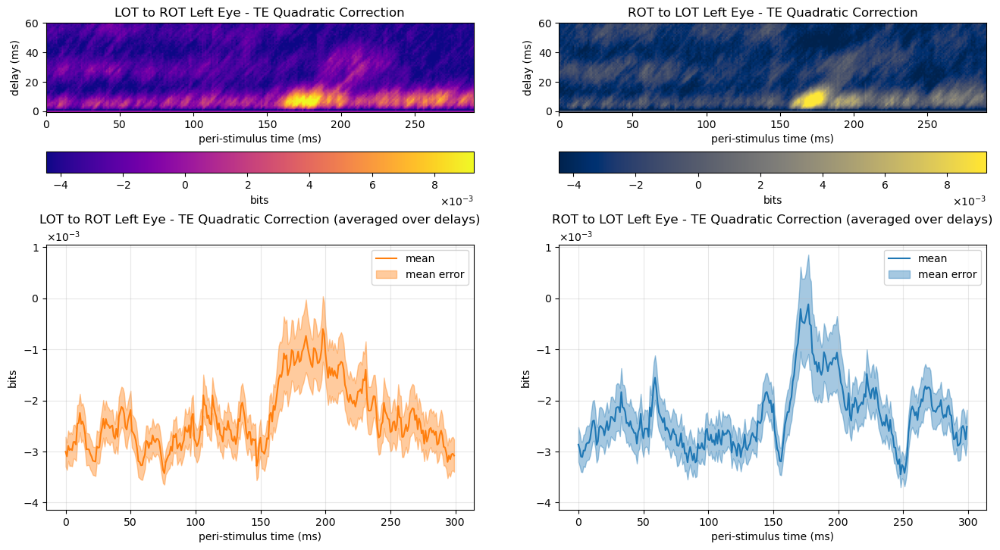

In [32]:
pu.plot_map4(left_LR[2, :, :], left_RL[2, :, :], 'Left Eye - TE Quadratic Correction',1.2,-9,'Paper',290,0.6)

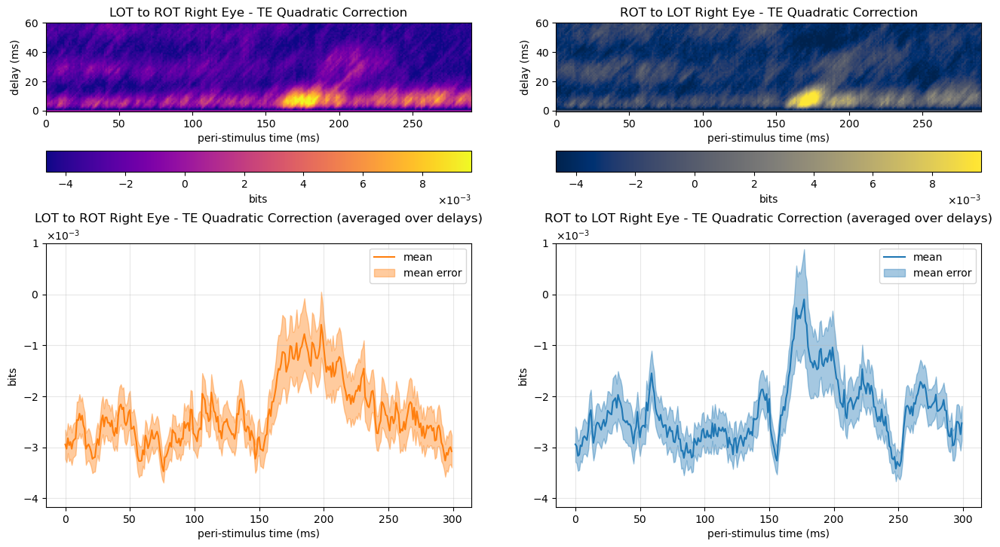

In [33]:
pu.plot_map4(right_LR[2, :, :], right_RL[2, :, :], 'Right Eye - TE Quadratic Correction',1.2,-10,'Paper',290,0.6)

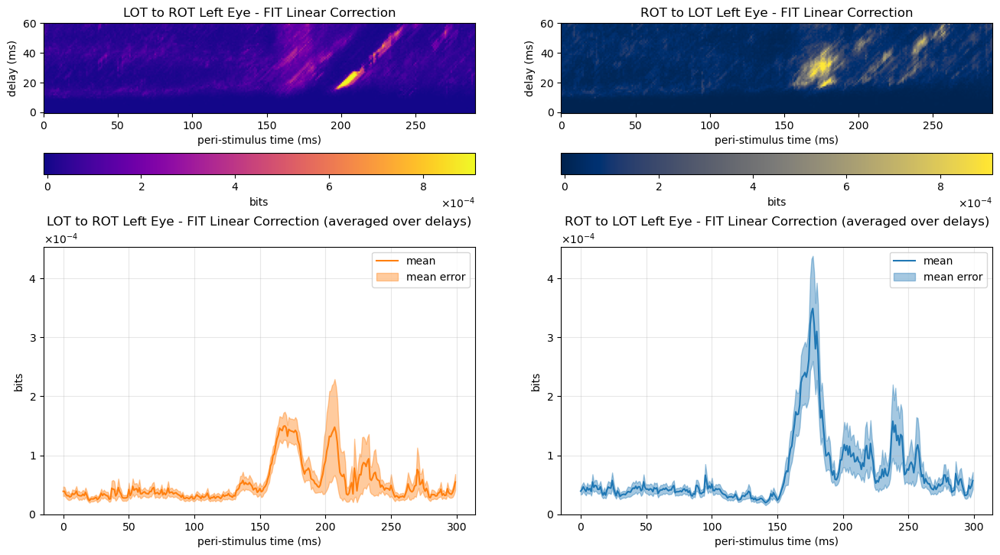

In [34]:
pu.plot_map4(left_LR[5, :, :], left_RL[5, :, :], 'Left Eye - FIT Linear Correction',0.0,1.3,'Paper',290,0.6)

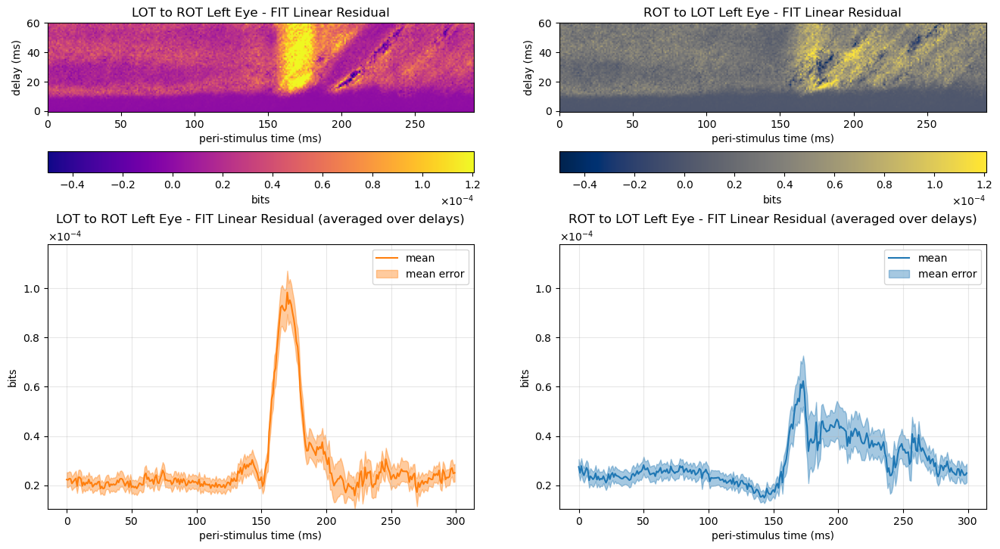

In [35]:
pu.plot_map4(left_LR[5, :, :, :]-left_LR[1, :, :, : ], left_RL[5, :, :, :]-left_RL[1, :, :, :], 'Left Eye - FIT Linear Residual',0.7,1.2,'Paper',290,0.6)

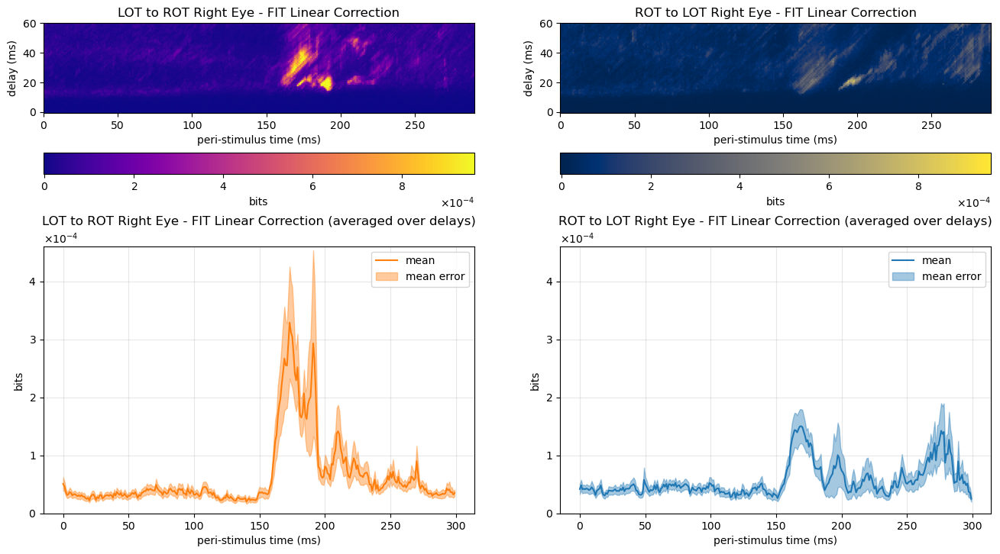

In [36]:
pu.plot_map4(right_LR[5, :, :], right_RL[5, :, :], 'Right Eye - FIT Linear Correction',0,1.4,'Paper',290,0.6)

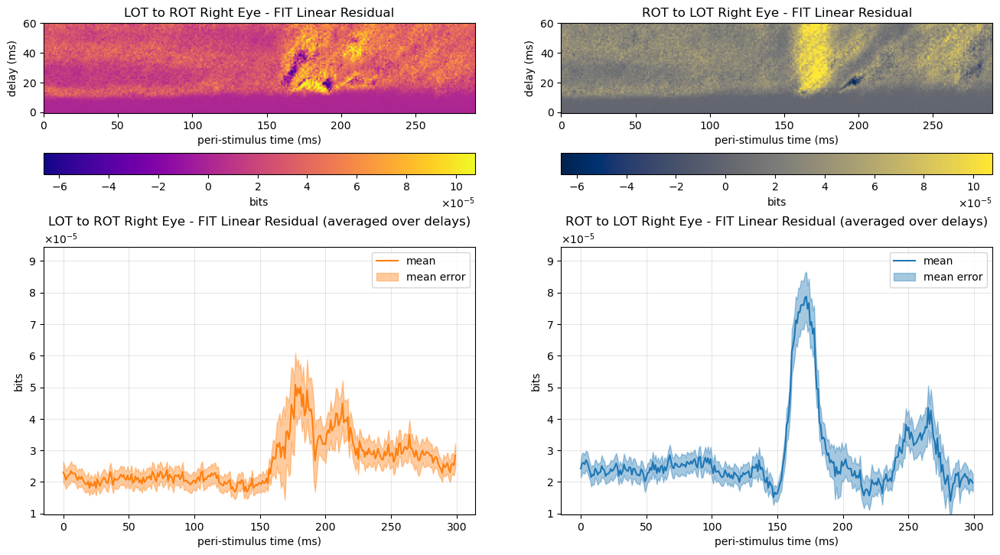

In [37]:
pu.plot_map4(right_LR[5, :, :, :]-right_LR[1, :, :, : ], right_RL[5, :, :, :]-right_RL[1, :, :, :], 'Right Eye - FIT Linear Residual',0.7,1.2,'Paper',290,0.6)

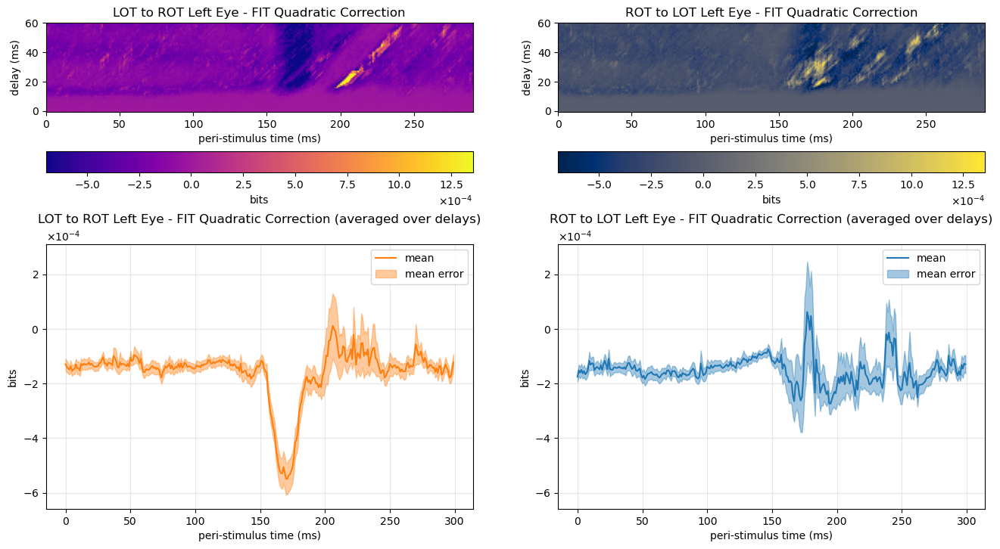

In [38]:
pu.plot_map4(left_LR[4, :, :], left_RL[4, :, :], 'Left Eye - FIT Quadratic Correction',1.2,5,'Paper',290,0.6)

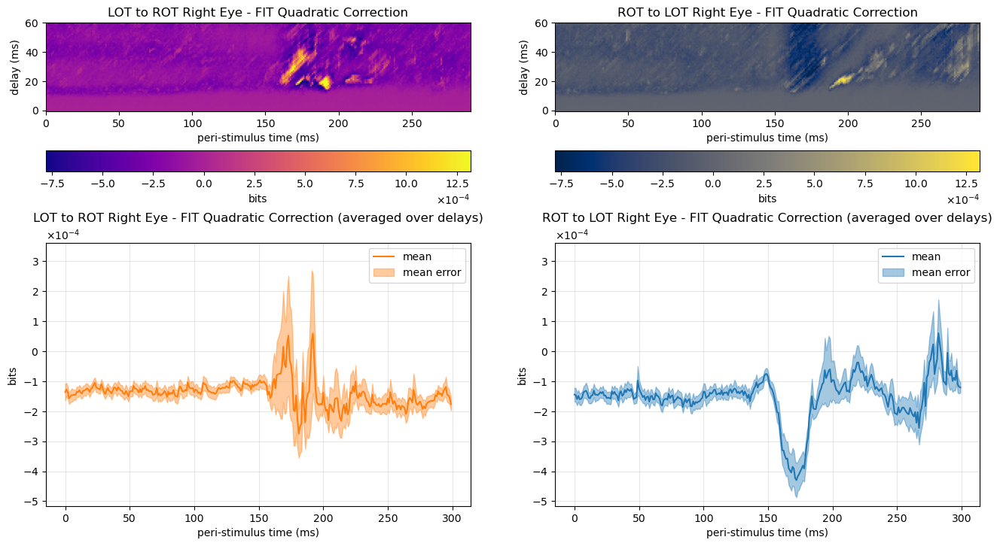

In [39]:
pu.plot_map4(right_LR[4, :, :,:], right_RL[4, :, :,:], 'Right Eye - FIT Quadratic Correction',1.2,6,'Paper',290,0.6)

We can see that a linear correction doesn't really change much the values of our estimate, indicating that the original sample size might be already close to the asymptotic one.<br>
For the quadratic one we see negative values, which can indicate two things, either the correction to be made is not non linear or the number of subsets used to do the fit is too small and too sensible to specific variations among the subsections (which would lead to a negative correction in some cases). However we averaged over several trials so we tend to consider the estimates as robust enough, which would lead to the conclusion that the approximately linear assumption holds in general for our dataset type.<br>
To see how much the linear correction adjusted the original TE and FIT we show the residuals as well. Here we can see that the FIT corrections were much smaller than the TE, indicating that the FIT approaches the asymptotic truth quicker, namely for smaller datasets. Furthermore we see that areas where the signal was stronger have a negative correction, which is correct as we have probably been too confident in those area's information strength.

## New Data

The new data consisted again in EEG data measured on a participant of a lab experiment. Images from 5 different categories ('faces', 'scenes', 'bodies', 'tools', 'scrambled') were shown and the participant was asked to classify them.<br>
We chose to analyze the OT brain regions from both sides in order to see the information flow from ROT to LOT and vice versa seen in the paper data. <br>
We also chose to see if there is eye-specific information flow from Visual OT to Motor areas in the brain in both directions.

In [40]:
# files
correct_binning = 'results_correct_800_all.pkl'

# load correct values
with open(correct_binning, 'rb') as f:
    data_raw = pkl.load(f) # deserialize using load()
    lr_di_vis = data_raw[0]
    lr_fit_vis = data_raw[1]
    lrq_di_vis = data_raw[2]
    lrl_di_vis = data_raw[3]
    lrq_fit_vis = data_raw[4]
    lrl_fit_vis = data_raw[5]
    rl_di_vis = data_raw[6] 
    rl_fit_vis = data_raw[7] 
    rlq_di_vis = data_raw[8] 
    rll_di_vis = data_raw[9] 
    rlq_fit_vis = data_raw[10] 
    rll_fit_vis = data_raw[11] 
    lr_di_mot = data_raw[12] 
    lr_fit_mot = data_raw[13] 
    lrq_di_mot = data_raw[14] 
    lrl_di_mot = data_raw[15] 
    lrq_fit_mot = data_raw[16] 
    lrl_fit_mot = data_raw[17] 
    rl_di_mot = data_raw[18] 
    rl_fit_mot = data_raw[19]
    rlq_di_mot = data_raw[20] 
    rll_di_mot = data_raw[21] 
    rlq_fit_mot = data_raw[22] 
    rll_fit_mot = data_raw[23] 

### Visual

We can see how FIT can better understand that there is no signal being transmitted from LOT to ROT while it enhances the signal being transmitted from ROT to LOT.

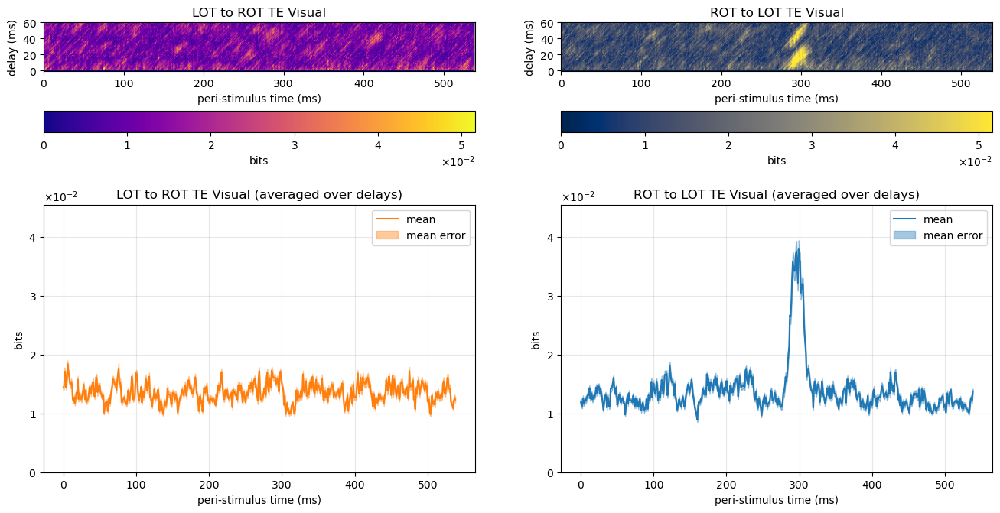

In [41]:
pu.plot_map4(lr_di_vis.T, rl_di_vis.T, 'TE Visual',0,1.2,'New',539,0.6)

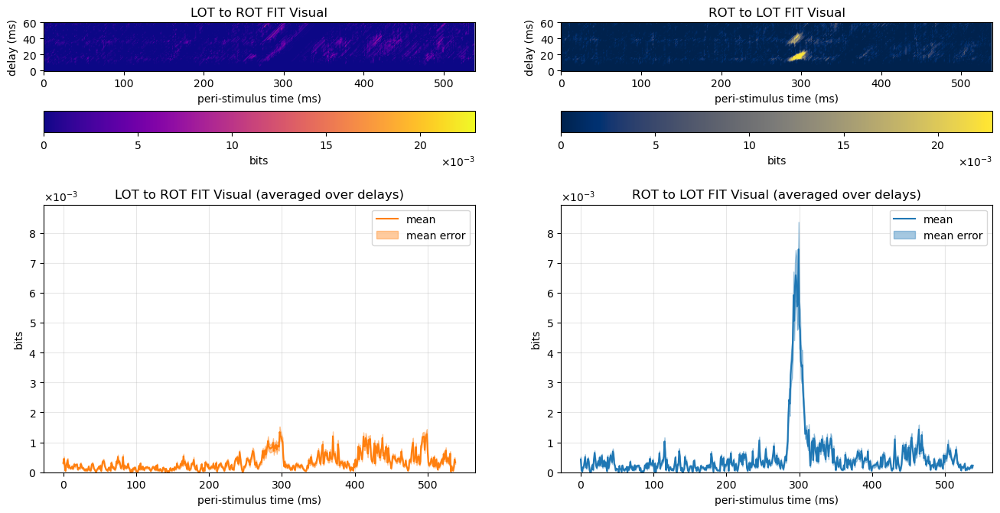

In [42]:
pu.plot_map4(lr_fit_vis.T, rl_fit_vis.T, 'FIT Visual',0,1.2,'New',539,0.6)

Here we show the linear and quadratic corrections for TE and FIT, the same considerations as before apply.

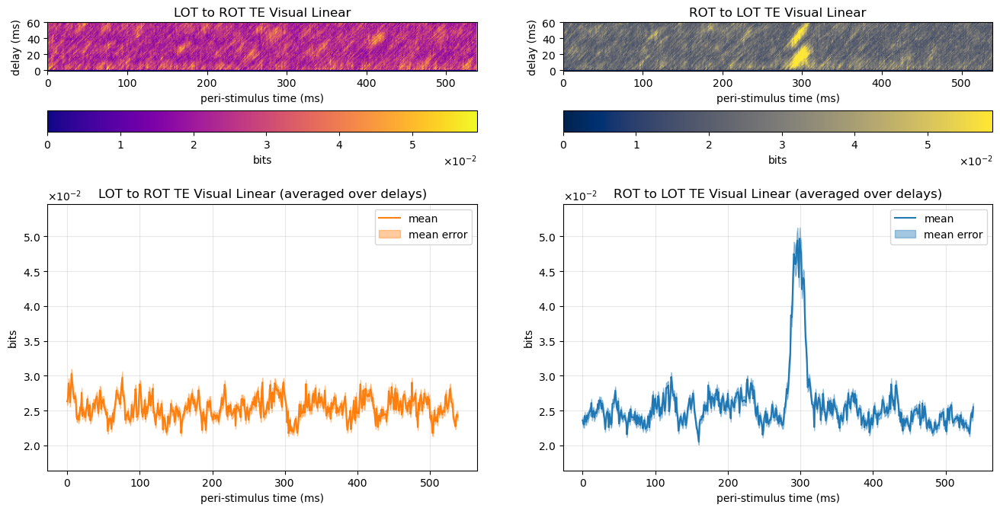

In [43]:
pu.plot_map4(lrl_di_vis.T, rll_di_vis.T, 'TE Visual Linear',0.8,1.1,'New',539,0.6)

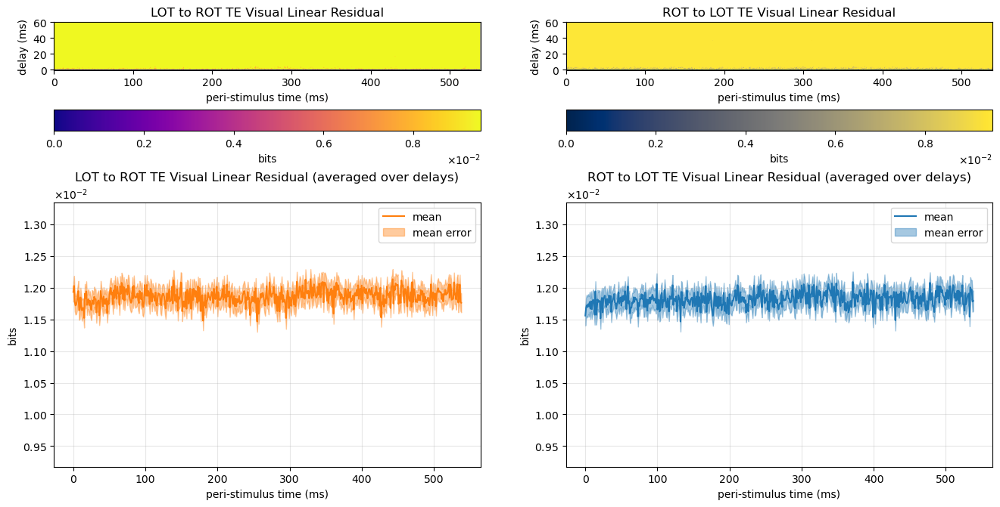

In [44]:
pu.plot_map4(lrl_di_vis.T-lr_di_vis.T, rll_di_vis.T-rl_di_vis.T, 'TE Visual Linear Residual',0.8,1.1,'New',539,1)

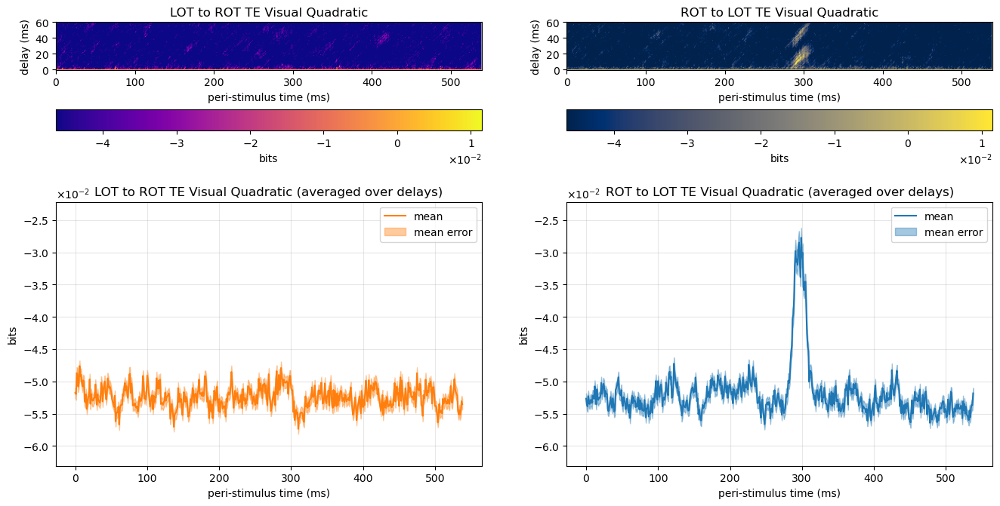

In [45]:
pu.plot_map4(lrq_di_vis.T, rlq_di_vis.T, 'TE Visual Quadratic',1.1,0.8,'New',539,0.6)

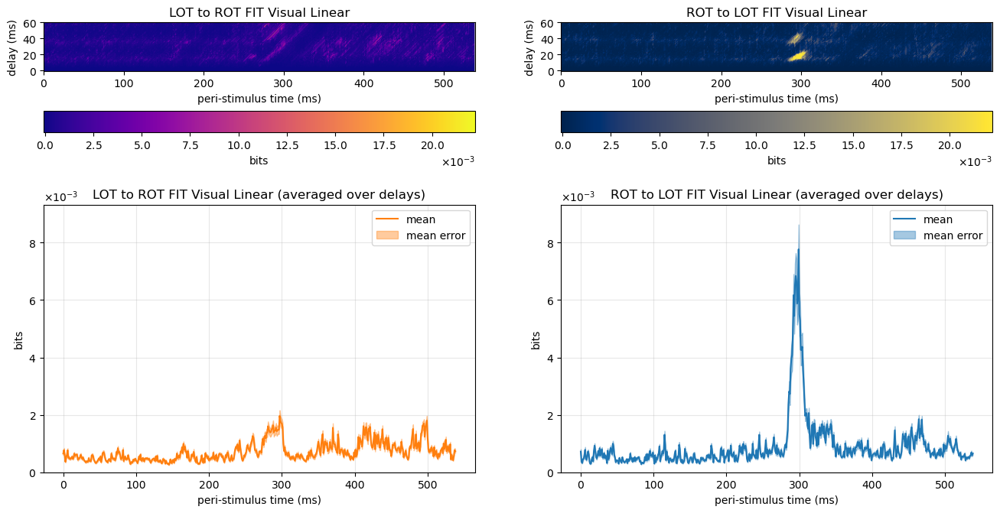

In [46]:
pu.plot_map4(lrl_fit_vis.T, rll_fit_vis.T, 'FIT Visual Linear',0,1.2,'New',539,0.6)

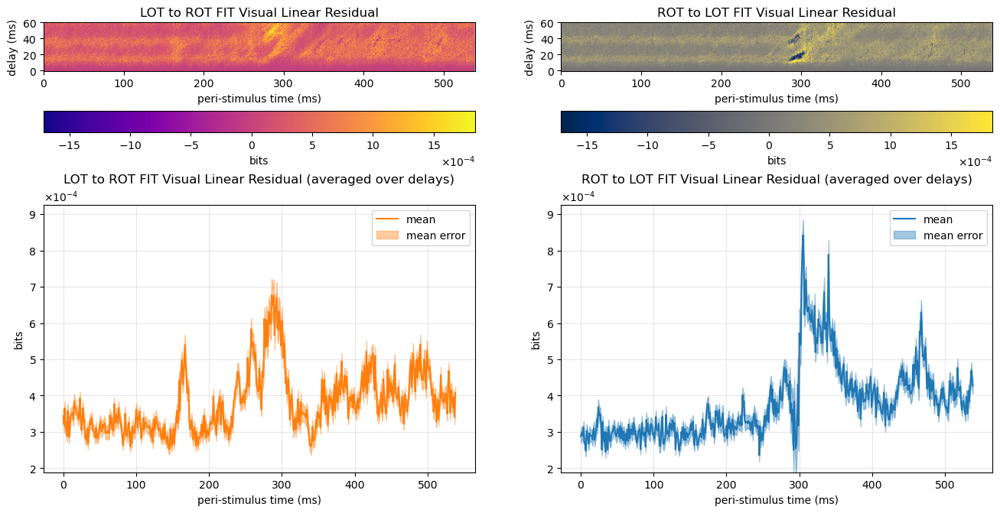

In [47]:
pu.plot_map4(lrl_fit_vis.T-lr_fit_vis.T, rll_fit_vis.T-rl_fit_vis.T, 'FIT Visual Linear Residual',0.8,1.1,'New',539,0.6)

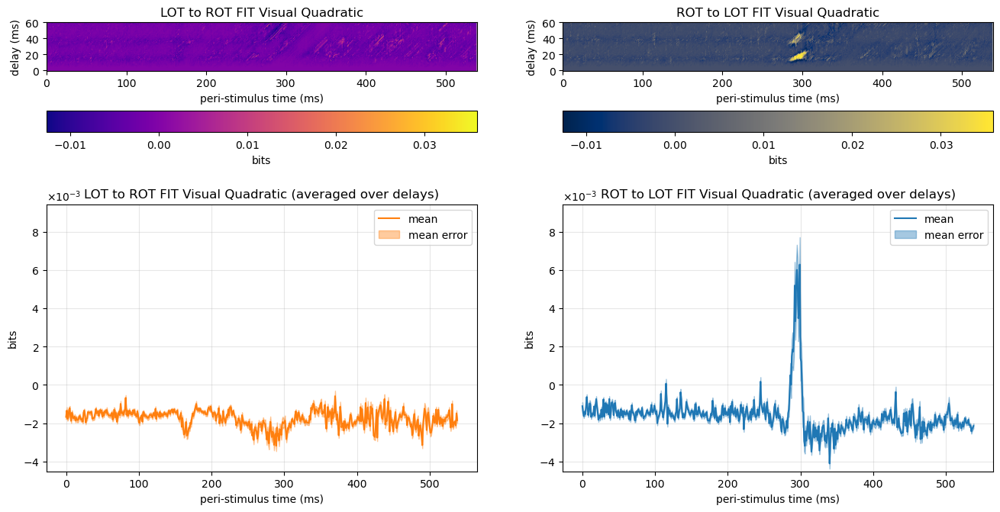

In [48]:
pu.plot_map4(lrq_fit_vis.T, rlq_fit_vis.T, 'FIT Visual Quadratic',1.1,1.5,'New',539,0.6)

### Visual to Motor

As far as visual to motor goes we can see that TE struggles to find any clear signal being sent in any direction while FIT measures a signal in both directions with the strongest from ROT to LOT (maybe an indicator the participant was right handed ?). <br>
Furthermore both signals were measured about 40 ms later than the visual to visual transmission, an indication of the correlation between sequentiality of the actions performed and the information flow inside the brain regions.

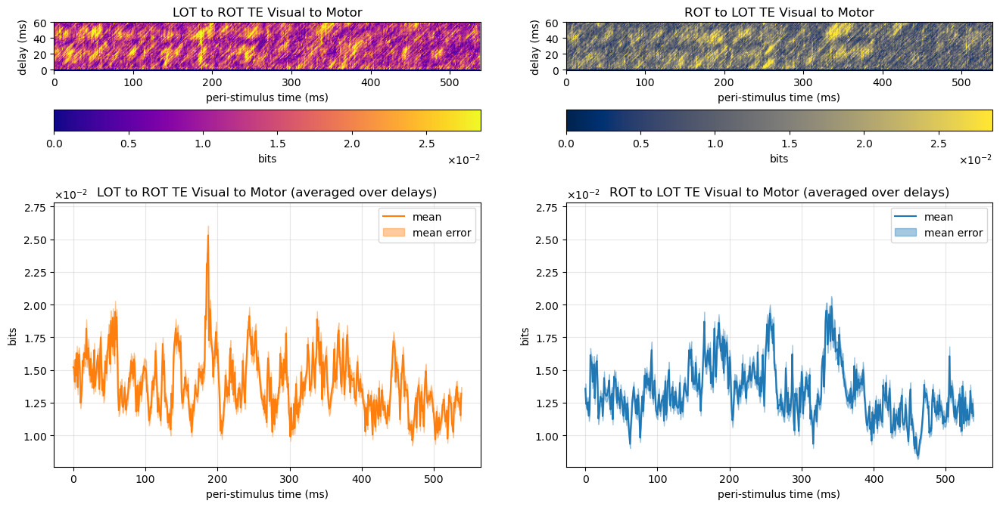

In [49]:
pu.plot_map4(lr_di_mot.T, rl_di_mot.T, 'TE Visual to Motor',0.9,1.1,'New',539,0.6)

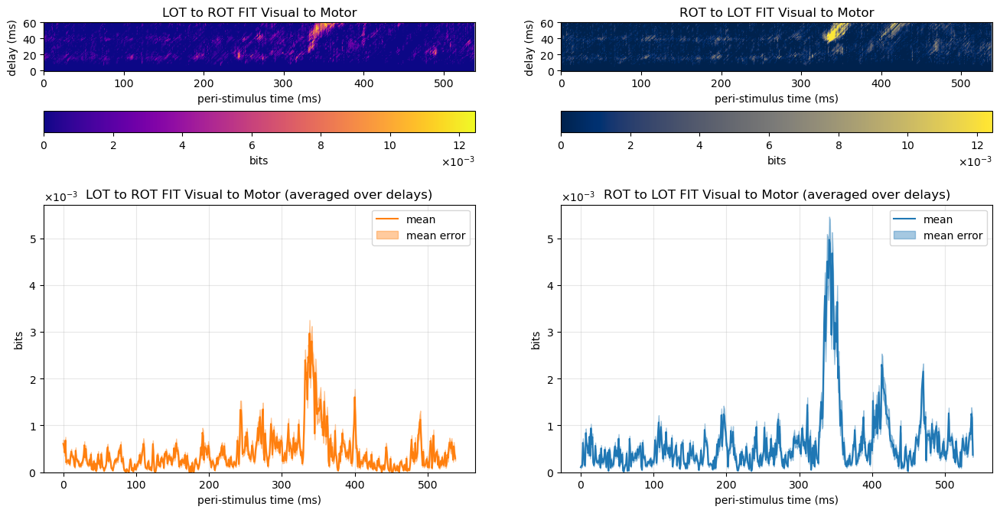

In [50]:
pu.plot_map4(lr_fit_mot.T, rl_fit_mot.T, 'FIT Visual to Motor',0,1.15,'New',539,0.6)

Again we show linear and quadratic corrections for TE and FIT

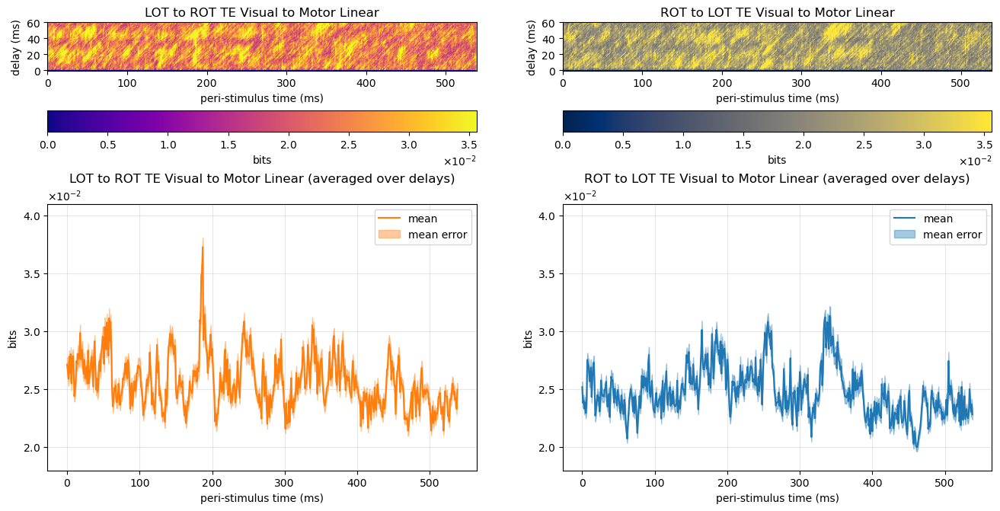

In [51]:
pu.plot_map4(lrl_di_mot.T, rll_di_mot.T, 'TE Visual to Motor Linear',0.9,1.1,'New',539,0.6)

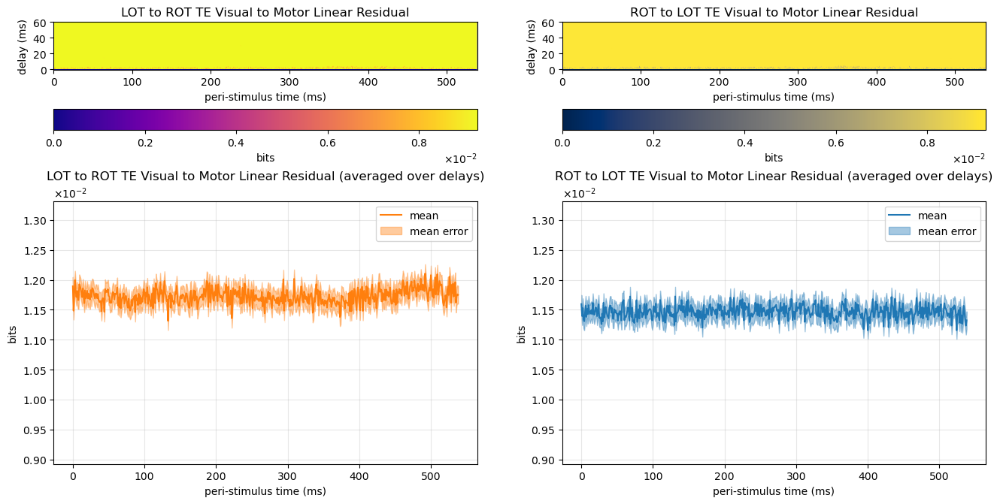

In [52]:
pu.plot_map4(lrl_di_mot.T-lr_di_mot.T, rll_di_mot.T-rl_di_mot.T, 'TE Visual to Motor Linear Residual',0.8,1.1,'New',539,1)

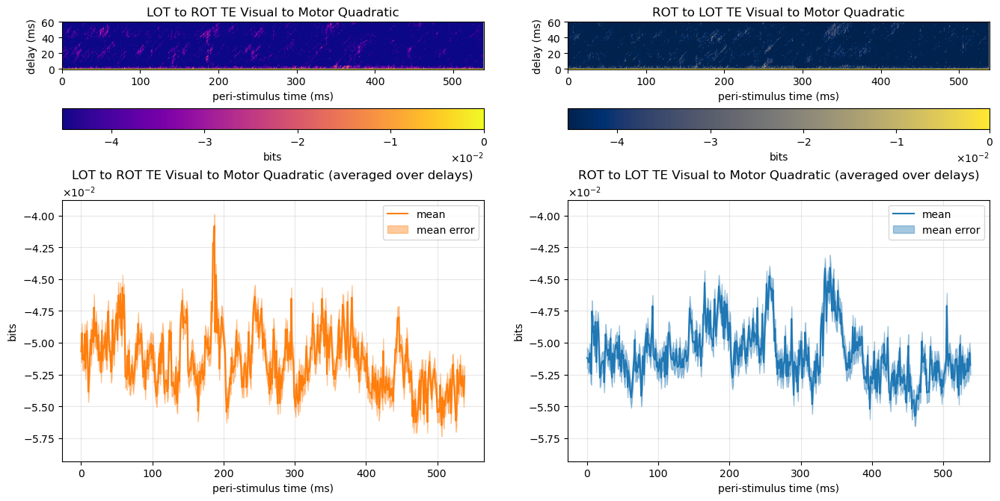

In [53]:
pu.plot_map4(lrq_di_mot.T, rlq_di_mot.T, 'TE Visual to Motor Quadratic',1.05,0.95,'New',539,0.6)

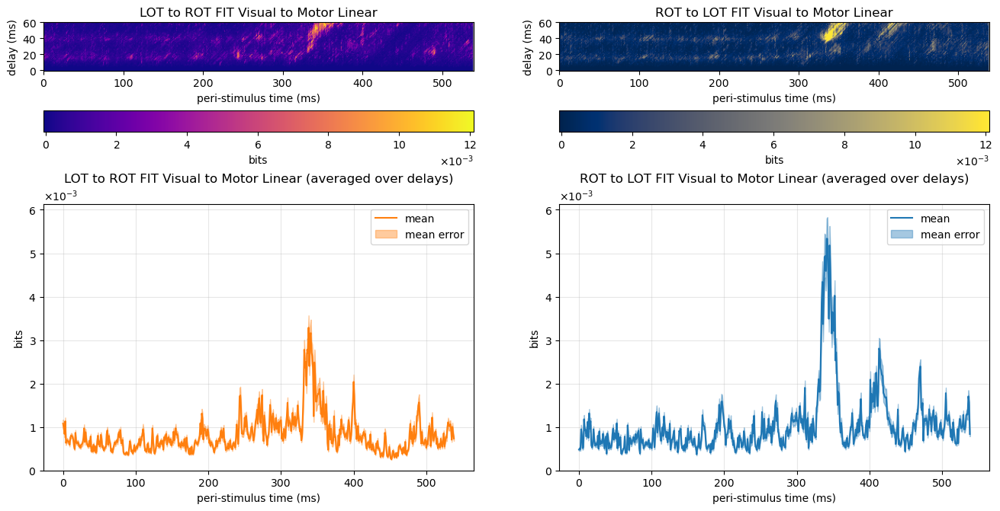

In [54]:
pu.plot_map4(lrl_fit_mot.T, rll_fit_mot.T, 'FIT Visual to Motor Linear',0,1.15,'New',539,0.6)

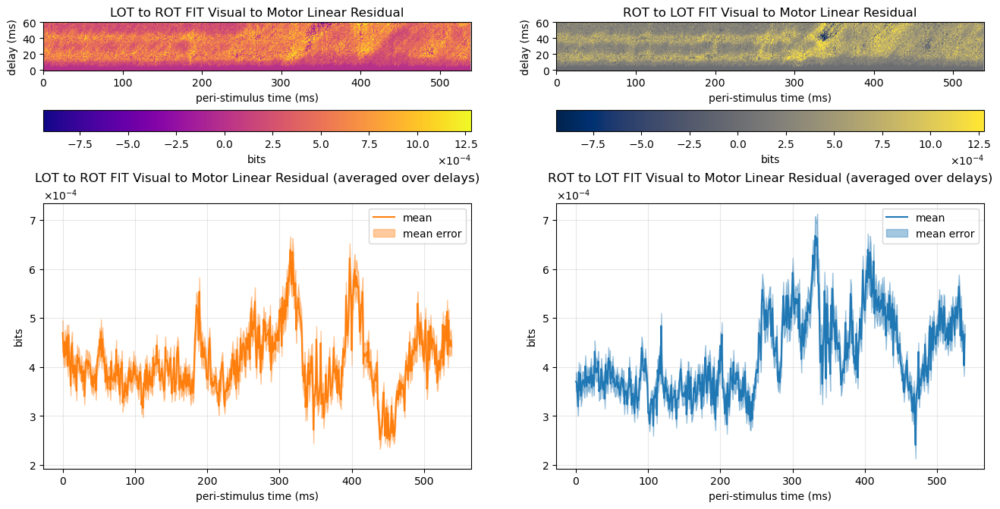

In [55]:
pu.plot_map4(lrl_fit_mot.T-lr_fit_mot.T, rll_fit_mot.T-rl_fit_mot.T, 'FIT Visual to Motor Linear Residual',0.8,1.1,'New',539,0.6)

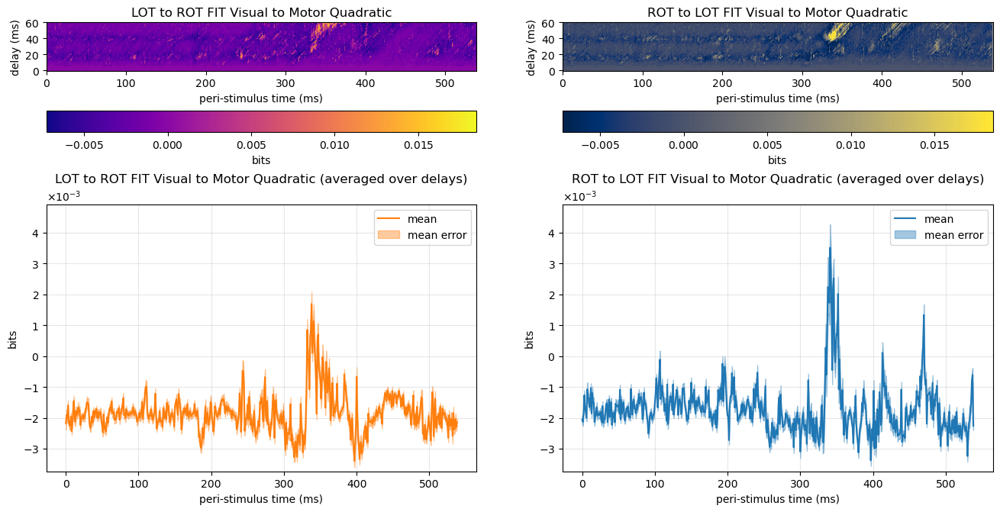

In [56]:
pu.plot_map4(lrq_fit_mot.T, rlq_fit_mot.T, 'FIT Visual to Motor Quadratic',1.1,1.4,'New',539,0.6)

For the bias corrections the same assumptions can be made as in the first dataset.